In [1]:
import time
import copy
import math
import numpy as np
from scipy.interpolate import CubicSpline
from numba import jit

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm, rc, animation
from IPython.display import Image
from MDAnalysis.coordinates.XYZ import XYZReader

%matplotlib inline
%load_ext autoreload
%autoreload 2

np.random.seed(170786)
rc('animation', html='html5')

In [2]:
def euc_dist(a,b):
    return np.sqrt(np.sum(np.square(a-b)))

## Zero-Temperature String Method for Smooth, Analytic 2D potentials

In [3]:
def string_method_2d(grad_potential, init_points, N, tol=None):
    # init_points is a tuple of two points
    a,b = init_points

    # initialize 'string' as a 2xN array
    string = np.linspace(a, b, N+1, dtype=np.float32).T
    
    # set tolerance and time step for gradient descent
    if tol is None:
        tol = max(N**(-4), 10**(-10))
    dt = 0.05*min(0.2, N**(-1))
    d = 100
    
    frames = []
    ds = []
    counter=0
    while d >= tol:
        
        # Gradient descent step
        force = grad_potential(string[0], string[1]) # 2xN array
        string_star = string - dt*force 

        # Normalize by arc length to readjust the string
        arcs = [0]
        for j in range(1, N+1):
            arcs.append(arcs[-1] + euc_dist(string_star[:,j], string_star[:,j-1]))
        arcs = np.array(arcs)
        alpha_istars = arcs/arcs[-1]
    
        # Draw new, evenly spaced string from interpolation of intermediate string
        
        # Can separate because normal basis
        phi_interpolatex = CubicSpline(alpha_istars, string_star[0], bc_type='not-a-knot')
        phi_interpolatey = CubicSpline(alpha_istars, string_star[1], bc_type='not-a-knot')
        
        # alpha
        alpha_is = np.arange(0, N+1, 1, dtype=np.float32)/N
        new_string = np.array([phi_interpolatex(alpha_is), phi_interpolatey(alpha_is)])

        
        # Calculate euclidean distance between new and old string
        distances = np.array([euc_dist(new_string[:,i], string[:,i]) for i in range(N+1)], dtype=np.float32)
        d = 1/dt*max(distances)
        ds.append(d)

        # Update string
        string=new_string
        counter+=1
        frames.append(string)
        
        
    return string, np.array(frames), np.array(ds)

### Implementation on Example Analytic 2-D Potentials

**Example 1:** Following the illustrative example presented in Weinan E, Ren, and Vanden-Eijnden (2007) https://doi.org/10.1063/1.2720838

The String length should converge to the arclength of a unit semi-circle (i.e., $\pi$)

In [4]:
# Weinan E, Ren, and Vanden-Eijnden illustrative example potential and grad
def potential_IE(x, y):
    return (1-x**2-y**2)**2 + y**2 / (x**2 + y**2)

def grad_potential_IE(x, y):
    r = x**2 + y**2
    partial_x = 2*x*(y**2*(2-r**-2)+2*x**2 - 2)
    partial_y = 2*y*(y**2*(2-r**-2) + 1/r + 2*x**2 - 2)
    return np.array([partial_x, partial_y])

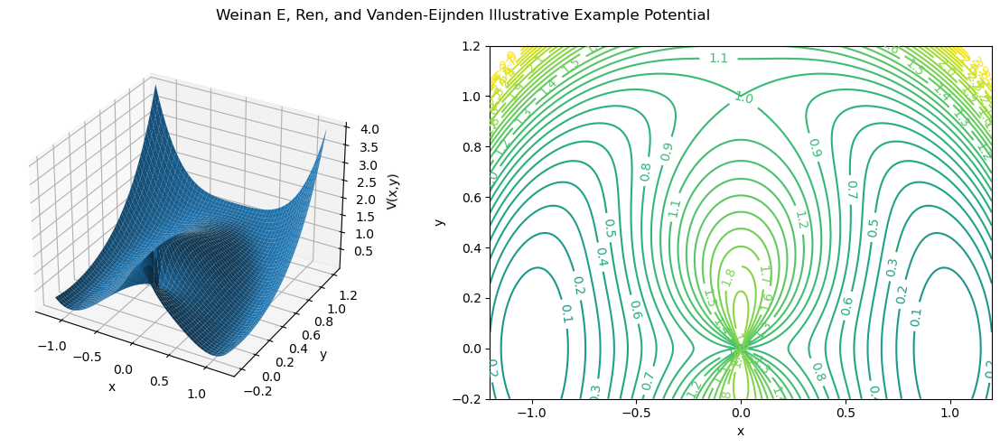

In [5]:
# Visualize potential
X = np.linspace(-1.2,1.2,1000)
Y = np.linspace(-0.2,1.2,1000)
X, Y = np.meshgrid(X,Y)
V = potential_IE(X,Y)
 
fig = plt.figure(figsize=(12,5))
ax1 = fig.add_subplot(121, projection='3d')
ax2 = fig.add_subplot(122)
 
ax1.plot_surface(X,Y,V)
ax1.set_xlabel('x')
ax1.set_ylabel('y')
ax1.set_zlabel('V(x,y)')

levels = np.arange(-3, 3, 0.1)
CS = ax2.contour(X,Y,V, levels)
ax2.clabel(CS, inline=1)
ax2.set_xlabel('x')
ax2.set_ylabel('y')

plt.suptitle('Weinan E, Ren, and Vanden-Eijnden Illustrative Example Potential')
plt.tight_layout()
plt.show()

In [6]:
# Illustrative Example ZTS Run

%time final_string_IE, frames_IE, ds_IE = string_method_2d(grad_potential_IE, [(-0.5, 0.5),(0.5,0.5)], 75)

CPU times: user 14.6 s, sys: 127 ms, total: 14.7 s
Wall time: 14.8 s


Text(0.5, 1.0, 'Solution to Illustrative Example')

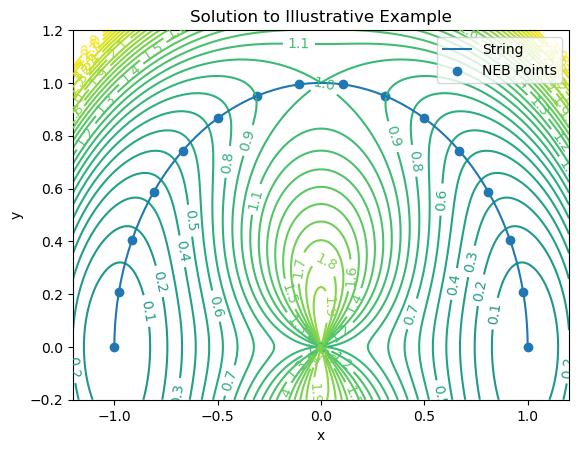

In [7]:
# Visualize string method solution
X = np.linspace(-1.2,1.2,1000)
Y = np.linspace(-0.2,1.2,1000)
X, Y = np.meshgrid(X,Y)
V = potential_IE(X,Y)

levels1 = np.arange(-3, 3, 0.1)
CS1 = plt.contour(X,Y,V, levels1)
plt.clabel(CS1, inline=1)
plt.plot(final_string_IE[0], final_string_IE[1])
plt.scatter(final_string_IE[0,::5], final_string_IE[1,::5])

plt.xlabel('x')
plt.ylabel('y')
plt.legend(['String', 'NEB Points'])

plt.title('Solution to Illustrative Example')

# print(len(test_frames))

In [8]:
# Save IE soln as gif

plt.ioff()
fig, ax = plt.subplots()
X = np.linspace(-1.2,1.2,1000)
Y = np.linspace(-0.2,1.2,1000)
X, Y = np.meshgrid(X,Y)
V = potential_IE(X,Y)
levels = np.arange(-3, 3, 0.1)

def test_animate(t):
    ax.cla()
    CS1 = ax.contour(X,Y,V, levels1)
    ax.plot(frames_IE[t, 0],frames_IE[t, 1])
    ax.set_xlim(-1.2, 1.2)
    ax.set_ylim(-0.2, 1.2)
    ax.set_title('Iterations = %d' % t)

test_anim = matplotlib.animation.FuncAnimation(fig, test_animate, frames=np.arange(0, int(len(frames_IE)/4), 30))
test_anim.save('./IE_animation.gif', writer='Pillow', fps=60)

plt.ioff()
plt.close()

MovieWriter Pillow unavailable; using Pillow instead.


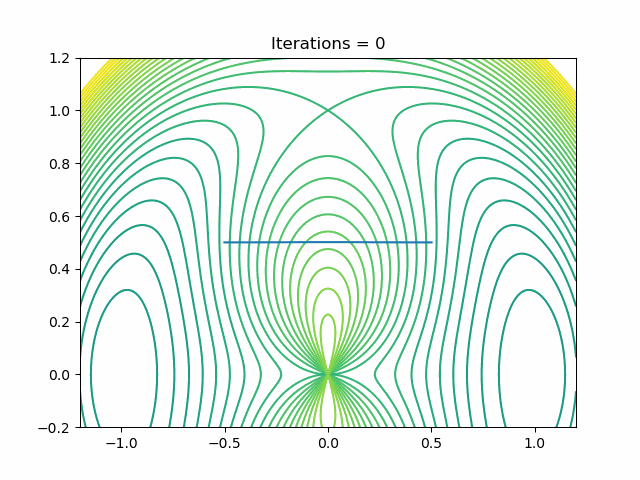

In [9]:
# Display IE solution gif
display(Image(data=open('./IE_animation.gif','rb').read(), format='png'))

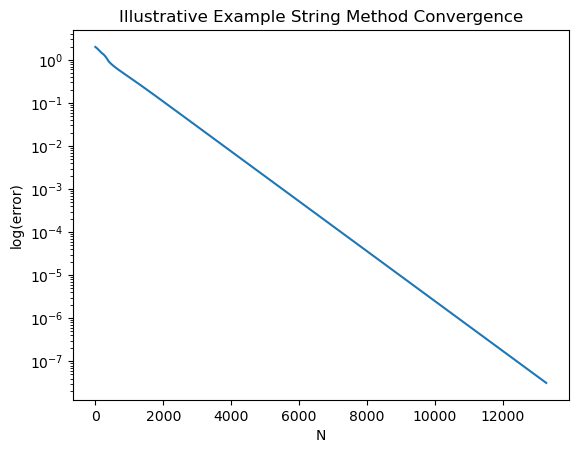

In [10]:
# Convergernce Analysis
test_runs = len(ds_IE)
runs = np.arange(0, test_runs, 1)
plt.plot(runs, ds_IE)
plt.yscale("log")
plt.ylabel('log(error)')
plt.xlabel('N')
plt.title('Illustrative Example String Method Convergence')
plt.show()

**Example 2:** Müller-Brown Potential

The Müller-Brown Potential is a classic toy potential in theoretical chemistry.

In [11]:
# Analytic Muller-Brown Potential and Gradient Definition
def potential_MB(x,y):

    A = np.array([-200, -100, -170, 15])
    a = np.array([-1,-1,-6.5,0.7])
    b = np.array([0,0,11,0.6])
    c = np.array([-10,-10,-6.5,0.7])
    x_0 = np.array([1,0,-.5,-1])
    y_0 = np.array([0,0.5,1.5,1])

    v = 0
    for k in range(4):
        xsub = (x-x_0[k])
        ysub = (y-y_0[k])
        v += A[k]*np.exp(a[k]*xsub**2 + b[k]*xsub*ysub + c[k]*ysub**2)
    
    return v

def grad_potential_MB(x,y):
    
    A = np.array([-200, -100, -170, 15])
    a = np.array([-1,-1,-6.5,0.7])
    b = np.array([0,0,11,0.6])
    c = np.array([-10,-10,-6.5,0.7])
    x_0 = np.array([1,0,-.5,-1])
    y_0 = np.array([0,0.5,1.5,1])

    partialx = 0
    partialy = 0
    for k in range(4):
        xsub = (x-x_0[k])
        ysub = (y-y_0[k])
        v_comp = A[k]*np.exp(a[k]*xsub**2 + b[k]*xsub*ysub + c[k]*ysub**2)
        partialx += (2*a[k]*xsub + b[k]*ysub)*v_comp
        partialy += (b[k]*xsub + 2*c[k]*ysub)*v_comp
    
    return np.array([partialx, partialy])

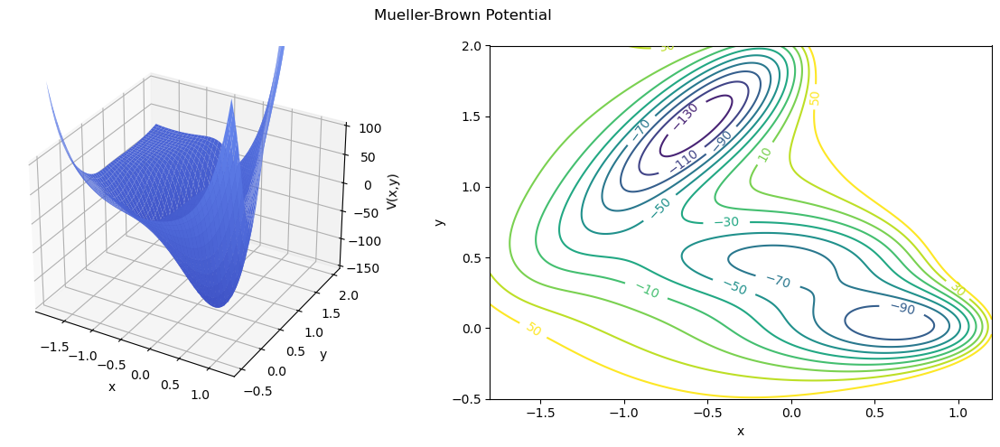

In [12]:
# Visualize Muller-Brown Potential
plt.close()
X = np.linspace(-1.8,1.2,1000)
Y = np.linspace(-0.5,2,1000)
X, Y = np.meshgrid(X,Y)
V = potential_MB(X,Y)
 
fig = plt.figure(figsize=(12,5))
ax1 = fig.add_subplot(121, projection='3d')
ax2 = fig.add_subplot(122)
 
ax1.plot_surface(X,Y,V, cmap=cm.coolwarm)
ax1.set_zlim(-150, 100)
ax1.set_xlabel('x')
ax1.set_ylabel('y')
ax1.set_zlabel('V(x,y)')

levels = np.arange(-150, 70, 20)
CS = ax2.contour(X,Y,V, levels)
ax2.clabel(CS, inline=1)
ax2.set_xlabel('x')
ax2.set_ylabel('y')

plt.suptitle('Mueller-Brown Potential')
plt.tight_layout()
plt.show()

In [13]:
# Muller-Brown Potential ZTS Run
%time final_string_MB, frames_MB, ds_MB = string_method_2d(grad_potential_MB, [(-1., 1.7),(0.5,0.0)], 200)

CPU times: user 675 ms, sys: 12.6 ms, total: 687 ms
Wall time: 672 ms


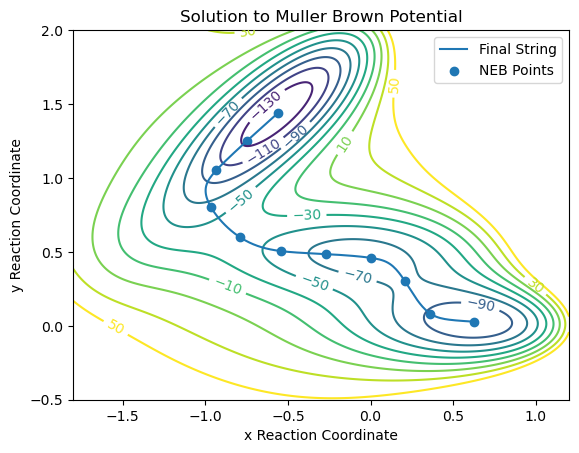

In [14]:
# Visualize Solution to Muller-Brown Potential
X = np.linspace(-1.8,1.2,1000)
Y = np.linspace(-0.5,2,1000)
X, Y = np.meshgrid(X,Y)
V = potential_MB(X,Y)

levels2 = np.arange(-150, 70, 20)
CS2 = plt.contour(X,Y,V, levels2)
plt.clabel(CS2, inline=1)
plt.plot(final_string_MB[0], final_string_MB[1])
plt.scatter(final_string_MB[0,::20], final_string_MB[1,::20])
plt.xlabel('x Reaction Coordinate')
plt.ylabel('y Reaction Coordinate')
plt.legend(['Final String', 'NEB Points'])
plt.title('Solution to Muller Brown Potential')
plt.show()

In [15]:
# Save soln as gif
plt.ioff()
fig, ax = plt.subplots()
X = np.linspace(-1.8,1.2,1000)
Y = np.linspace(-0.5,2,1000)
X, Y = np.meshgrid(X,Y)
V = potential_MB(X,Y)
levels2 = np.arange(-150, 70, 10)

def test_animate(t):
    ax.cla()
    CS2 = ax.contour(X,Y,V, levels2)
    ax.plot(frames_MB[t, 0],frames_MB[t, 1])
    ax.set_xlim(-1.8,1.2)
    ax.set_ylim(-0.5,2)
    ax.set_xlabel('x Reaction Coordinate')
    ax.set_ylabel('y Reaction Coordinate')
    ax.set_title('Muller-Brown Potential String Method')

test2_anim = matplotlib.animation.FuncAnimation(fig, test_animate, frames=np.arange(0, int(len(frames_MB)/2), 2))
test2_anim.save('./muller_animation.gif', writer='Pillow', fps=60)

plt.ioff()
plt.close()

MovieWriter Pillow unavailable; using Pillow instead.


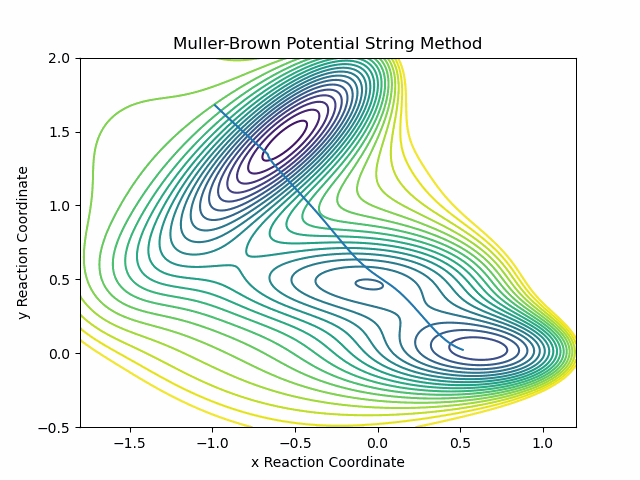

In [16]:
# Display IE solution gif
display(Image(data=open('./muller_animation.gif','rb').read(), format='png'))

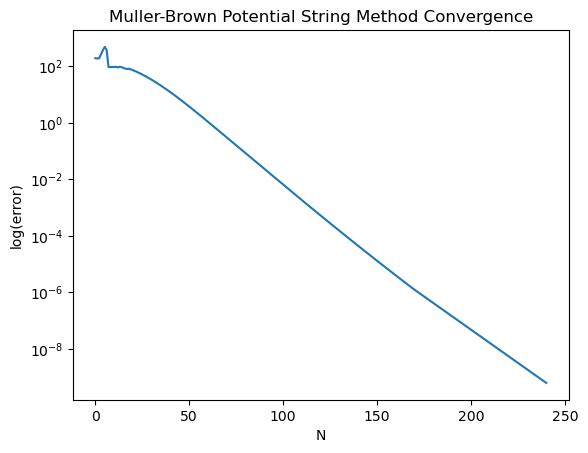

<function matplotlib.pyplot.ioff()>

In [17]:
# Convergernce Analysis
runs_MB = len(ds_MB)
runs = np.arange(0, runs_MB, 1)
plt.plot(runs, ds_MB)
plt.yscale("log")
plt.ylabel('log(error)')
plt.xlabel('N')
plt.title('Muller-Brown Potential String Method Convergence')
plt.draw()
plt.show()
plt.ioff

**Example 3:** Arbitrary Dipeptide Bond Angle Potential

The following is an imagined, arbitrary dipeptide bond angle potential description

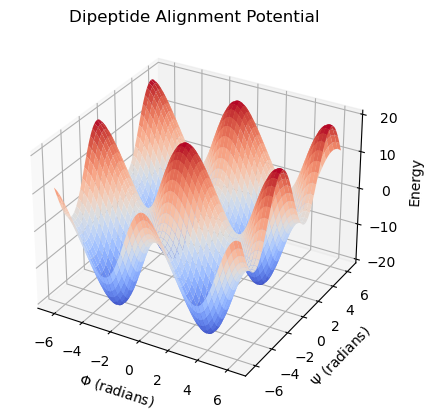

In [18]:
# Analytic Dipeptide Potential and Gradient
def potential_dipeptide(phi, psi, A=1, B=10, C=-10, D=-1):
    term1 = A * np.cos(psi)
    term2 = B * np.cos(phi)
    term3 = C * np.sin(psi)
    term4 = D * np.sin(2*phi)
    return term1 + term2 + term3 + term4
 
def gradient_dipeptide(phi, psi, A=1, B=10, C=-10, D=-1):
    dphi = -B * np.sin(phi) + 2*D * np.cos(2*phi)
    dpsi = -A * np.sin(psi) + C * np.cos(psi)
    return np.array([dphi, dpsi])
 
# Generate data for plotting the potential surface
phi = np.linspace(-2*np.pi, 2*np.pi, 1000)
psi = np.linspace(-2*np.pi, 2*np.pi, 1000)
PHI, PSI = np.meshgrid(phi, psi)
Z = potential_dipeptide(PHI, PSI)
 
# Plot the potential surface
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(PHI, PSI, Z, cmap='coolwarm')
ax.set_xlabel(r'$\Phi$ (radians)')
ax.set_ylabel(r'$\Psi$ (radians)')
ax.set_zlabel('Energy')
ax.set_title('Dipeptide Alignment Potential')
plt.show()

In [19]:
# Dipeptide Potential ZTS Run
%time solution_dipeptide = string_method_2d(gradient_dipeptide, [(3, -4),(-3,2)], 200)

CPU times: user 32 s, sys: 406 ms, total: 32.5 s
Wall time: 32.3 s


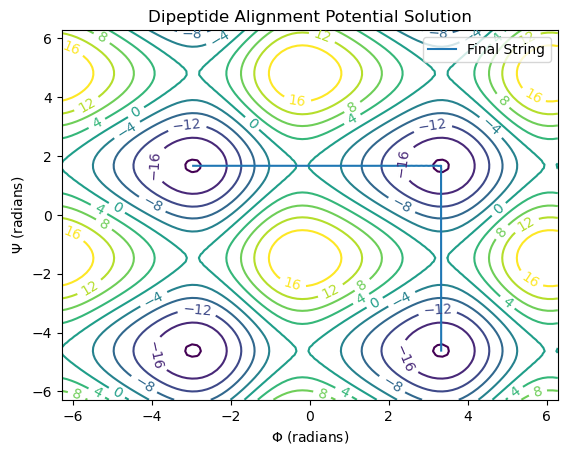

In [20]:

phi = np.linspace(-2*np.pi, 2*np.pi, 100)
psi = np.linspace(-2*np.pi, 2*np.pi, 100)
PHI, PSI = np.meshgrid(phi, psi)
Z = potential_dipeptide(PHI, PSI)

levels3 = np.arange(-20, 20, 4)
CS = plt.contour(PHI,PSI,Z, levels3)
plt.clabel(CS, inline=1)
plt.plot(solution_dipeptide[0][0], solution_dipeptide[0][1])
plt.xlabel(r'$\Phi$ (radians)')
plt.ylabel(r'$\Psi$ (radians)')
plt.legend(['Final String'])
plt.title('Dipeptide Alignment Potential Solution')
plt.show()
plt.close()

## Zero_Temperature String Method on Higher Dimensional Potentials


**Illustration 1:** Argon Liquid Cloud

Here, we calculate the Minimum Energy Path (MEP) of an Argon atom moving through a static cloud of 125 Ar atoms with liquid phase configurational energy.

The Static Argon Cloud description is taken from a Classical Monte-Carlo simulation of 125 Ar atom at 85K and 100 bar (liquid phase)

In [21]:
def string_method_ar(f_i, xyz, L, sigma, epsilon, init_points, imgN, dim=3):
    # init_points is a tuple of two points
    a,b = init_points

    # initialize string
    string = np.linspace(a, b, imgN+1, dtype=np.float32).T
    
    # set tolerance and time step for gradient descent    
    tol = max(imgN**(-4), 10**(-10)) #too low for this system
    dt = 0.05*min(0.2, imgN**(-1))
    d = 100
    
    alpha_is = np.arange(0, imgN+1, 1, dtype=np.float32)/imgN
    frames = []
    ds = []
    counter=0
    while d >= tol:
        
        # Gradient descent step
        # f_i returns the negative gradient wrt position of potential of all argon atoms
        string_forces = f_i(string, xyz, L, sigma, epsilon)
        string_star = string + dt*string_forces*5e-8

        # (not used) overwrite updates to initial and final string nodes to fix end points
        # string_star[:,0]=string[:,0]
        # string_star[:,-1]=string[:,-1]
        
        # Normalize by arc length to readjust the string
        alpha_istars = arclength_repram(string_star, imgN)
        new_string = []
        for i in range(dim):
            phi_interpolate_i = CubicSpline(alpha_istars, string_star[i], bc_type='not-a-knot')
            new_string.append(phi_interpolate_i(alpha_is))
        new_string = np.array(new_string)

        # Calculate distance between new and old string
        max_dist=max_distance(new_string, string, imgN)
        d = 1/dt*max_dist
        ds.append(d)
        # print(counter, d)
        
        # Update string
        frames.append(string)
        string=new_string
        counter+=1
        if counter > 4000:
            break

    return string, np.array(frames), np.array(ds)

In [22]:
# Read in Argon Liquid Positions from XYZ File
trajFile='Ar_liq_MC.xyz'
traj = XYZReader(trajFile)

xyz_traj = []
for frame in range(len(traj)):
    xyz_traj.append(np.array(copy.deepcopy(traj[frame].positions[:,:]))/10.) #Ang -> nm
xyz_traj = np.array(xyz_traj)
nFrames = len(xyz_traj)
N=xyz_traj[0].shape[0]

# Box Lengths from MC Simulation
Ls = [2.35256775, 2.29073127, 2.18829343, 2.11864596, 2.06680909, 2.04974418,
 2.01616739, 1.98185927, 1.94088118, 1.92253743, 1.90887376, 1.91528815,
 1.89824706, 1.88437256, 1.91310228, 1.87222012, 1.88668835, 1.87887617,
 1.87564441, 1.87885715, 1.83939654, 1.82831102, 1.83595319, 1.8408789,
 1.83245414, 1.83825717, 1.83464098, 1.83832322, 1.82732627, 1.83883966,
 1.84295693, 1.85016722, 1.85000764, 1.85196374, 1.83936563, 1.83666743,
 1.8323653,  1.81955109, 1.82256624, 1.8145722,  1.81473886, 1.8085208,
 1.80421093, 1.80300056, 1.82015139, 1.81822719, 1.81666049, 1.82717098,
 1.82477328, 1.82914594, 1.814161,   1.814161,   1.81985076, 1.81985076,
 1.82849219, 1.80925875, 1.81298525, 1.83220051, 1.81209462, 1.81711937,
 1.81059333, 1.80867483, 1.80907934, 1.80907934, 1.81430902, 1.80231243,
 1.80438027, 1.81383788, 1.80316065, 1.79644912, 1.81668519, 1.80763621,
 1.80654518, 1.80079132, 1.8056709,  1.82370377, 1.81776947, 1.80253571,
 1.80110078, 1.80328942, 1.80200234, 1.80200234, 1.80999827, 1.81123345,
 1.81422873, 1.81590273, 1.82508102, 1.82387046, 1.82609966, 1.83952649,
 1.81871555, 1.81806926, 1.80752408, 1.8080858,  1.80943352, 1.81665952,
 1.82898209, 1.81312581, 1.81392535, 1.82807788]



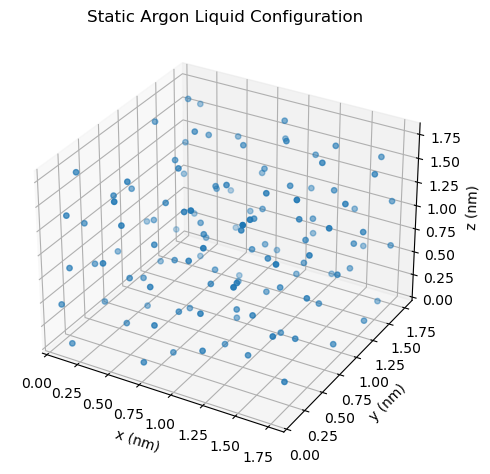

In [23]:
# 3D Atomic Model Visualization
def plot_config(xyz, L, title = None):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    
    ax.scatter(xyz[:,0], xyz[:,1], xyz[:,2], zdir='z', s = 15, depthshade=True)

    ax.set_xlim([0,L])
    ax.set_ylim([0,L])
    ax.set_zlim([0,L])
    
    ax.set_xlabel('x (nm)')
    ax.set_ylabel('y (nm)')
    ax.set_zlabel('z (nm)')
    
    
    if title is not None:
        ax.set_title(title)
        plt.tight_layout()

    plt.draw()
    plt.show()

    return None

plot_config(xyz_traj[49], Ls[49], title = 'Static Argon Liquid Configuration')


In [24]:
# London-Jones Potential and Gradient functions and method subfunctions
@jit
def r_ij(ri, rj, L):
    dr = rj - ri
    halfL = L/2.

    for i in range(3):
        if dr[i] >= halfL:
            dr[i] -= L
        elif dr[i] < -halfL:
            dr[i] += L

    return dr
@jit
def dist(a,b):
    return np.sqrt(np.sum(np.square(a-b)))

@jit
def f_ij(r,sigma,epsilon):
    s = np.sqrt(np.sum(np.square(r))) # r is rij
    usub = sigma/s
    f_mag = (-48*epsilon/s**2)*(usub**12 - 0.5*usub**6)

    return f_mag*r

@jit
def f_i(string,xyz,L,sigma,epsilon):
    
    fi_sums = np.zeros(string.shape)
    
    for (i, ri) in enumerate(np.transpose(string)):
        for rj in xyz:
            rij = r_ij(ri, rj, L)
            fi_sums[:,i] += f_ij(rij, sigma, epsilon)
    
    return fi_sums

@jit
def arclength_repram(string_star, imgN):
    arcs = [0]
    for j in range(1, imgN+1):
        arcs.append(arcs[-1] + dist(string_star[:,j], string_star[:,j-1]))
    arcs = np.array(arcs)
    alpha_istars = arcs/arcs[-1]
                
    return alpha_istars

@jit
def max_distance(new_string, string, imgN):
    max_dist = dist(new_string[:,0],string[:,0])
    for i in range(1, imgN+1):
        dist_i = dist(new_string[:,i], string[:,i])
        if dist_i > max_dist:
            max_dist = dist_i
    return max_dist

In [25]:
# Ar Liquid ZTS Method Run
sigma=0.34 #nm
epsilon=1.65 #zJ
L = Ls[60]
xyz = xyz_traj[60]
init_points=[(0, 0.25, 0.1), (.9*L, .9*L, .9*L)] #nm

%time Liq_ar_test = string_method_ar(f_i, xyz, L, sigma, epsilon, init_points, 300, dim=3)

CPU times: user 1min 7s, sys: 750 ms, total: 1min 8s
Wall time: 1min 8s


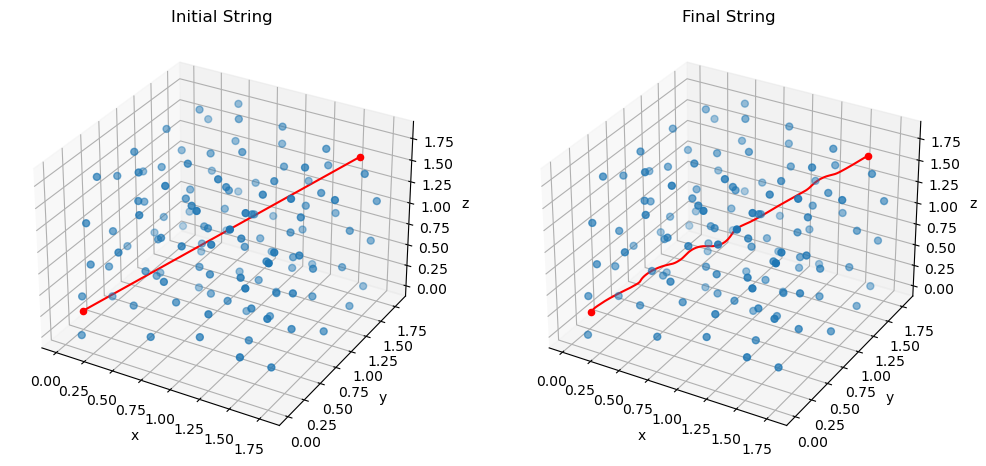

In [26]:
# Ar Liquid String Method Solution Visualization
plt.style.use('default')

solx, soly, solz = Liq_ar_test[0]

fig = plt.figure(figsize=(12,7))
ax = fig.add_subplot(122, projection='3d')
ax2 = fig.add_subplot(121, projection='3d')

ax.scatter(xyz[:,0], xyz[:,1], xyz[:,2], s = 25)
ax.plot(solx, soly, solz, '-r')
ax.scatter(solx[0], soly[0], solz[0], color='r')
ax.scatter(solx[-1], soly[-1], solz[-1], color='r')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_title('Final String')


init_st = np.linspace((0, 0.25, 0.1), (.9*L, .9*L, .9*L), 300)
ax2.scatter(xyz[:,0], xyz[:,1], xyz[:,2], s = 25)
ax2.plot(init_st[:,0], init_st[:,1], init_st[:,2], 'r')
ax2.scatter(init_st[0, 0], init_st[0, 1], init_st[0, 2], color='r')
ax2.scatter(init_st[-1, 0], init_st[-1, 1], init_st[-1, 2], color = 'r')
ax2.set_xlabel('x')
ax2.set_ylabel('y')
ax2.set_zlabel('z')
ax2.set_title('Initial String')

plt.draw()
plt.show()

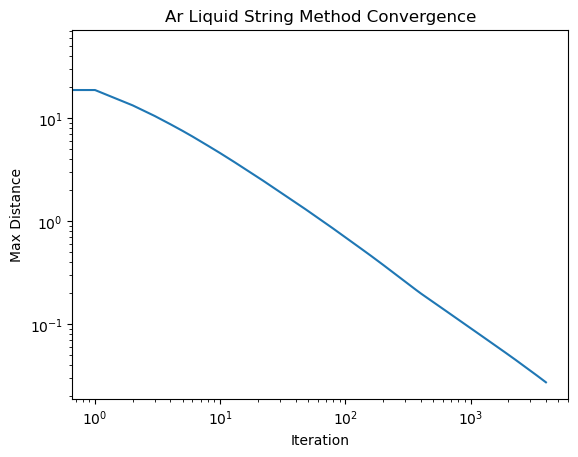

In [37]:
# Ar Liquid String Method Convergence Plot
liq_ar_ds = Liq_ar_test[2]
plt.plot(list(range(len(liq_ar_ds))), liq_ar_ds)
plt.yscale("log")
plt.xscale('log')
plt.xlabel('Iteration')
plt.ylabel('Max Distance')
plt.title('Ar Liquid String Method Convergence')
plt.show()


In [28]:
# Energy of state along string
def min_dist(r1,r2,L):
    halfL = L/2.
    dx = r2[0]-r1[0]
    dy = r2[1]-r1[1]
    dz = r2[2]-r1[2]
    if dx >= halfL:
        dx -= L
    elif dx < -halfL:
        dx += L
    if dy >= halfL:
        dy -= L
    elif dy < -halfL:
        dy += L
    if dz >= halfL:
        dz -= L
    elif dz < -halfL:
        dz += L

    return math.sqrt(dx**2+dy**2+dz**2)

def E_ij(s,sigma,epsilon):
    usub = sigma/s
    energy = 4*epsilon*(usub**12 - usub**6)
    return energy

def E_i(r,xyz,L,sigma,epsilon):
    
    Ei_sum = 0
    for (j, particle) in enumerate(xyz):
        s = min_dist(r, particle, L)
        Eij = E_ij(s, sigma, epsilon)
#         print(j, s, Eij)
        Ei_sum += Eij
    return Ei_sum

# for imgs in 

solution = Liq_ar_test[0]
soln_frames = Liq_ar_test[1]

sol_Es = []
rxn_coordinate = []
for j, img in enumerate(solution.T):
    sol_Es.append(E_i(img, xyz, L, sigma, epsilon))
    rxn_coordinate.append(j)
sol_Es = np.array(sol_Es)

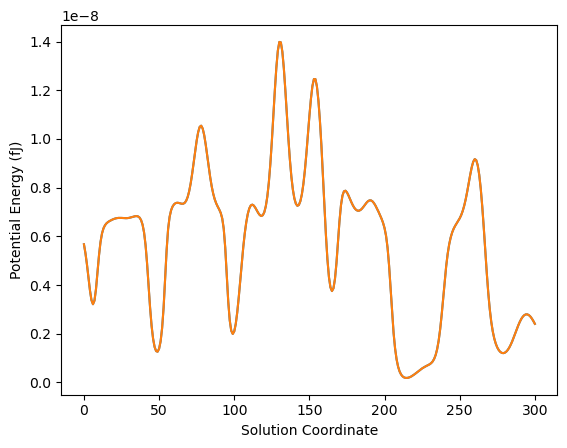

In [36]:
plt.plot(rxn_coordinate, sol_Es*1e-6)
plt.ylabel('Potential Energy (fJ)')
plt.xlabel('Solution Coordinate')

plt.show()

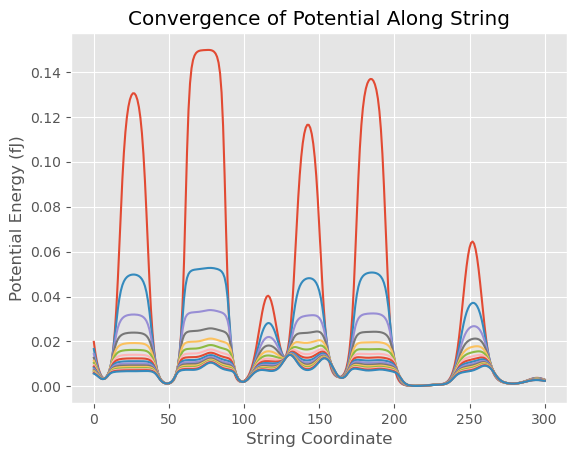

In [34]:
plt.style.use ('ggplot')
soln_frames = Liq_ar_test[1]

for i, string in enumerate(soln_frames[100::250]):
    sol_Es = []
    rxn_coordinate = []
    for j, img in enumerate(string.T):
        sol_Es.append(1e-6*E_i(img, xyz, L, sigma, epsilon))
        rxn_coordinate.append(j)
    plt.plot(rxn_coordinate, sol_Es)
sol_Es = np.array(sol_Es)

plt.title('Convergence of Potential Along String')
plt.ylabel('Potential Energy (fJ)')
plt.xlabel('String Coordinate')

plt.show()
plt.style.use('default')